# 1) Importing Datasets & First Merge

</a></span></li><li><span>
[Importing Trump Tweets Dataset](#Importing-Trump-Tweets-Dataset)
<a href='Importing Donald Trump Tweets'></a>
</a></span></li><li><span>
    
[Introduction of Financial Data and Merge](#Introduction-of-Financial-Data-and-Merge)
<a href='Introduction of Financial Data and Merge'></a>

    

# 2) Preliminary Feature Engineering: Explanatory Variable 

</a></span></li><li><span>
[High Low Binary Variable](#High-Low-Binary-Variable)
<a href='High Low Binary Variable'></a>

# 3) EDA

</a></span></li><li><span>
[Keyword Analysis](#Keyword-Analysis)
<a href='Keyword Analysis'></a>
</a></span></li><li><span>

[Further EDA using various tie metrics to potentially add to dummy variables of hour](#Further-EDA-using-various-tie-metrics-to-potentially-add-to-dummy-variables-of-hour)
<a href='Further EDA using various tie metrics to potentially add to dummy variables of hour'></a>
</a></span></li><li><span>

[Average Daily Volume](#Average-Daily-Volume)
<a href='Average Daily Volume'></a>
</a></span></li><li><span>

[Creating Mean hourly Volumes for that specific hour](#Creating-Mean-hourly-Volumes-for-that-specific-hour)
<a href='Creating Mean hourly Volumes for that specific hour'></a>
</a></span></li><li><span>

[Creating mean hourly volumes across entire dataset](#Creating-mean-hourly-volumes-across-entire-dataset)
<a href='Creating mean hourly volumes across entire dataset'></a>
</a></span></li><li><span>

[Sustained Volume Increase?](#Sustained-Volume-Increase?)
<a href='Sustained Volume Increase?'></a>
</a></span></li><li><span>
    
[Create hour binary variable](#Create-hour-binary-variable)
<a href='Create hour binary variable'></a>


# Importing Trump Tweets Dataset

---

In [34]:
import pandas as pd
import re
import datetime as dt
from datetime import datetime
from datetime import timedelta
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import matplotlib as plot

In [35]:
df = pd.read_csv('trump_new.csv')

In [36]:
df.head()

,Unnamed: 0,source,text,is_retweet,released_at,text_new
0,0,Twitter for iPhone,Good news seems to be happening with respect t...,False,10-22-2019 22:18:29,Good news seems to be happening with respect t...
1,1,Twitter for iPhone,"RT @NASA: ìYouíre doing an incredible job,î sa...",True,10-22-2019 14:08:14,"RT @NASA: ìYouíre doing an incredible job,î sa..."
2,2,Twitter for iPhone,RT @WhiteHouse: Fall is here! Come enjoy the b...,True,10-22-2019 14:07:27,RT @WhiteHouse: Fall is here! Come enjoy the b...
3,3,Twitter for iPhone,Great Job Tim! https://t.co/WhgO67CfKP10-22-20...,False,10-22-2019 14:06:55,Great Job Tim! https://t.co/WhgO67CfKP
4,4,Twitter for iPhone,RT @JessicaDitto45: ìEmpowering half the world...,True,10-22-2019 14:06:17,RT @JessicaDitto45: ìEmpowering half the world...


In [37]:
type(df.released_at)

pandas.core.series.Series

In [38]:
df['new_dates'] = pd.to_datetime(df.released_at).dt.tz_localize('UTC').dt.tz_convert('America/Los_Angeles')

In [39]:
new_dates = []
for i in range(len(df)):
    tm = df.new_dates[i]
    tm = tm - timedelta(minutes=tm.minute % 1,
                             seconds=tm.second,
                             microseconds=tm.microsecond)
    new_dates.append(tm) # The function above rounds the tweet to the nearest minute, to be able to merge the
                         # minute-by-minute financial data.

In [40]:
df['created_at'] = new_dates
df.shape

(15944, 8)

In [41]:
df.reset_index(inplace=True)#Reset the index to perform the merge on the dates
df.set_index('created_at', inplace=True) 


# Introduction of Financial Data and Merge

---


In [42]:
sp_df = pd.read_csv('/Users/harryfield/Desktop/Spooz 2011-19 M1 (1).txt') 
sp_df.Date = pd.to_datetime(sp_df.Date, utc=False) #To merge on above
sp_df.set_index('Date', inplace=True)
sp_df = sp_df[sp_df.VOL!=0] #If no volume in the minute of tweeting, data will be skewed

In [43]:
august = pd.read_csv('ES_Aug.txt') #Merging more recent data
sept = pd.read_csv('ES_Sep.txt')
october = pd.read_csv('ES_Oct.txt')

In [44]:
print(august.shape)
print(sept.shape)
print(october.shape)

(28585, 8)
(21803, 8)
(19104, 8)


In [45]:
frames = [august, sept, october]
month_merge = pd.concat(frames)

In [46]:
month_merge.Date = pd.to_datetime(month_merge.Date, utc=False)
month_merge.set_index('Date', inplace=True)
month_merge = month_merge[month_merge.VOL!=0]

In [47]:
frames_final = [sp_df, month_merge]

In [48]:
snp_final = pd.concat(frames_final)

In [49]:
snp_final.shape #Dropping duplicates below as the snp

(2980704, 7)

In [50]:
snp_final.drop_duplicates(inplace=True)

In [51]:
snp_final.shape

(2713013, 7)

In [ ]:
#The below is a vital step for feature engineering: finding out the difference 
#between the open and the high/close of each minute, in order to merge to the tweet
#dataset and find the impact of Trump's tweets on these prices within any of the 
#45 minutes after he tweets

In [81]:
for i in range(0,46):
    snp_final['max_price{}'.format(i)] = (snp_final.High.shift(-i)-snp_final.Open.shift(-i))/snp_final.Open.shift(-i) *100
    snp_final['min_price{}'.format(i)] = (snp_final.Low.shift(-i)-snp_final.Open.shift(-i))/snp_final.Open.shift(-i) *100
for j in range(0,21):
    snp_final['volume_{}'.format(j)] = (snp_final.Volume.shift(-i+1)- snp_final.Volume.shift(-i))/snp_final.Volume.shift(-i) * 100

In [52]:
df.head()

,index,Unnamed: 0,source,text,is_retweet,released_at,text_new,new_dates
created_at,,,,,,,,
2019-10-22 15:18:00-07:00,0,0,Twitter for iPhone,Good news seems to be happening with respect t...,False,10-22-2019 22:18:29,Good news seems to be happening with respect t...,2019-10-22 15:18:29-07:00
2019-10-22 07:08:00-07:00,1,1,Twitter for iPhone,"RT @NASA: ìYouíre doing an incredible job,î sa...",True,10-22-2019 14:08:14,"RT @NASA: ìYouíre doing an incredible job,î sa...",2019-10-22 07:08:14-07:00
2019-10-22 07:07:00-07:00,2,2,Twitter for iPhone,RT @WhiteHouse: Fall is here! Come enjoy the b...,True,10-22-2019 14:07:27,RT @WhiteHouse: Fall is here! Come enjoy the b...,2019-10-22 07:07:27-07:00
2019-10-22 07:06:00-07:00,3,3,Twitter for iPhone,Great Job Tim! https://t.co/WhgO67CfKP10-22-20...,False,10-22-2019 14:06:55,Great Job Tim! https://t.co/WhgO67CfKP,2019-10-22 07:06:55-07:00
2019-10-22 07:06:00-07:00,4,4,Twitter for iPhone,RT @JessicaDitto45: ìEmpowering half the world...,True,10-22-2019 14:06:17,RT @JessicaDitto45: ìEmpowering half the world...,2019-10-22 07:06:17-07:00


In [53]:
new_dates = [] #This is to correct the todatetime function
for i in range(0, df.shape[0]):
    new_dates.append(str(df.index[i])[:-6]) 

In [54]:
df['new_dates'] = new_dates

In [55]:
df.set_index('new_dates', inplace=True)

In [56]:
df.head()

,index,Unnamed: 0,source,text,is_retweet,released_at,text_new
new_dates,,,,,,,
2019-10-22 15:18:00,0,0,Twitter for iPhone,Good news seems to be happening with respect t...,False,10-22-2019 22:18:29,Good news seems to be happening with respect t...
2019-10-22 07:08:00,1,1,Twitter for iPhone,"RT @NASA: ìYouíre doing an incredible job,î sa...",True,10-22-2019 14:08:14,"RT @NASA: ìYouíre doing an incredible job,î sa..."
2019-10-22 07:07:00,2,2,Twitter for iPhone,RT @WhiteHouse: Fall is here! Come enjoy the b...,True,10-22-2019 14:07:27,RT @WhiteHouse: Fall is here! Come enjoy the b...
2019-10-22 07:06:00,3,3,Twitter for iPhone,Great Job Tim! https://t.co/WhgO67CfKP10-22-20...,False,10-22-2019 14:06:55,Great Job Tim! https://t.co/WhgO67CfKP
2019-10-22 07:06:00,4,4,Twitter for iPhone,RT @JessicaDitto45: ìEmpowering half the world...,True,10-22-2019 14:06:17,RT @JessicaDitto45: ìEmpowering half the world...


In [57]:
df.index = pd.to_datetime(df.index)

In [58]:
snp_final.to_csv('snp_final.csv')

In [82]:
df_full = pd.merge(df, snp_final, left_index=True, right_index=True)
#Performing the final merge after reformatting dates

In [85]:
df_full.shape

(10154, 127)

In [86]:
df_full = df_full[df_full.text.str.startswith(r'https')==False] #Removing any photos
#as unable to perform sentiment analysis on a photo (yet!)

When tokenizing, check for special characters in csv

# Preliminary Feature Engineering: Explanatory Variable 

---

# High Low Binary Variable

---

In [87]:
high_low_list = []
for i in range(0,6): #using 5 mins as the original threshold, given 80% of trades are
    high_low_list.append('min_price{}'.format(i)) #now performed w/ algos in USA
    high_low_list.append('max_price{}'.format(i))

In [88]:
high_low_list[11]

'max_price5'

In [89]:
def make_binary_high_low(df):
    data_list = []
    for i in range(0, df.shape[0]): #for every tweet 
        if round(df.iloc[i].min(),11) <=-0.10: #if 
#             print(df.iloc[i].max())
            data_list.append(-1)
        elif round(df.iloc[i].max(),11) >=0.10:
#             print(df.iloc[i].min())
            data_list.append(1)
        else:
            data_list.append(0)
#             print(df.iloc[i].max())
    return data_list

In [90]:
df_high_low_trial = df_full[high_low_list]

In [91]:
df_full['pct_sig_ch_high_low'] = make_binary_high_low(df_high_low_trial)

In [92]:
df_full.pct_sig_ch_high_low.value_counts()

 0    9388
-1     378
 1     222
Name: pct_sig_ch_high_low, dtype: int64

In [93]:
#After the rigorous LSA, I decided to experiment with a restricted dependant variable

In [94]:
df_full.pct_sig_ch_high_low.where(df_full.index.year>=2018, 0, inplace=True)

In [95]:
df_full.pct_sig_ch_high_low.value_counts()

 0    9658
-1     212
 1     118
Name: pct_sig_ch_high_low, dtype: int64

In [96]:
df_full.pct_sig_ch_high_low.value_counts(normalize=True)

 0    0.966960
-1    0.021225
 1    0.011814
Name: pct_sig_ch_high_low, dtype: float64

In [97]:
df_full[df_full.pct_sig_ch_high_low.abs()==1].index.min()

Timestamp('2018-01-24 16:27:00')

In [99]:
df_full[df_full.pct_sig_ch_high_low.abs()==1].to_csv('trial_y_orig.csv')

In [101]:
df_full.to_csv('df_new_y_thresholds.csv')

# Keyword Analysis

In [433]:
# Use 'tariff' as an example in hyp to gauage accurate timefrane below - trying to figure out how long it 
# Would take to guage the S&P reaction from the tweet. This was before 

In [434]:
# Trying to visually isolate where most of the impact has occured to set the boundaries of 'statistically'
# Impactful

In [ ]:
# Why did I use % change high close and not % change from minute to minute?

In [423]:
# So, pct ch sig is very loosely correlated with open prices at 5 mins, 8 mins, 11 mins and 15 mins after
# It could also be worth exploring the intra minute price volatility of previous minutes and min-by-min

In [321]:
df_full.columns

Index(['index', 'favorite_count', 'text', 'in_reply_to_screen_name',
       'is_retweet', 'retweet_count', 'id_str', 'Close', 'High', 'Low',
       ...
       'volume_6', 'volume_7', 'volume_8', 'volume_9', 'pct_sig_ch_high_low',
       'pct_sig_ch_high_low_10', 'pct_sig_ch_high_low_upper',
       'pct_sig_ch_high_low_10_2', 'pct_sig_ch_high_low_5_2',
       'pct_sig_ch_high_low_10_25'],
      dtype='object', length=179)

In [212]:
df_full[df_full.text.str.contains(r'tariff',flags=re.IGNORECASE, regex=True)]['pct_sig_ch_high_low'].value_counts(normalize=True)

 0    0.872727
-1    0.100000
 1    0.027273
Name: pct_sig_ch_high_low, dtype: float64

In [213]:
df_full[df_full.text.str.contains(r'tariff',flags=re.IGNORECASE, regex=True)]['pct_sig_ch_high_low'].value_counts()

 0    96
-1    11
 1     3
Name: pct_sig_ch_high_low, dtype: int64

In [214]:
## Re-Run Regression with binary classifier: significant vs. non-significant ##
## Maybe look into using 'China' as an indicator?

In [215]:
df_subset = df_full[df_full['pct_sig_ch_high_low'].abs()==1]

In [218]:
df_subset

,index,Unnamed: 0,source,text,is_retweet,released_at,text_new,Close,High,Low,...,volume_2,volume_20,volume_3,volume_4,volume_5,volume_6,volume_7,volume_8,volume_9,pct_sig_ch_high_low
2018-01-24 16:27:00,8932,8932,Twitter for iPhone,"Will soon be heading to Davos, Switzerland, to...",False,01-25-2018 00:27:00,"Will soon be heading to Davos, Switzerland, to...",2843.25,2844.25,2843.00,...,1.000770,1.000770,1.000770,1.000770,1.000770,1.000770,1.000770,1.000770,1.000770,-1
2018-01-25 14:38:00,8929,8929,Twitter for iPhone,"Today, Americans everywhere remember the brave...",False,01-25-2018 22:38:21,"Today, Americans everywhere remember the brave...",2847.50,2848.50,2847.50,...,7.577749,7.577749,7.577749,7.577749,7.577749,7.577749,7.577749,7.577749,7.577749,-1
2018-02-01 19:32:00,8909,8909,Twitter for iPhone,The Democrats just arenít calling about DACA. ...,False,02/02/2018 03:32:48,The Democrats just arenít calling about DACA. ...,2821.75,2822.75,2821.50,...,46.766917,46.766917,46.766917,46.766917,46.766917,46.766917,46.766917,46.766917,46.766917,1
2018-02-05 12:42:00,8889,8889,Twitter for iPhone,Thanks to the historic TAX CUTS that I signed ...,False,02/05/2018 20:42:01,Thanks to the historic TAX CUTS that I signed ...,2741.50,2742.00,2741.00,...,-51.838671,-51.838671,-51.838671,-51.838671,-51.838671,-51.838671,-51.838671,-51.838671,-51.838671,-1
2018-02-06 05:32:00,8888,8888,Twitter for iPhone,So disgraceful that a person illegally in our ...,False,02/06/2018 13:32:57,So disgraceful that a person illegally in our ...,2575.00,2578.50,2572.25,...,-72.003284,-72.003284,-72.003284,-72.003284,-72.003284,-72.003284,-72.003284,-72.003284,-72.003284,-1
2018-02-06 05:37:00,8887,8887,Twitter for iPhone,My prayers and best wishes are with the family...,False,02/06/2018 13:37:00,My prayers and best wishes are with the family...,2577.75,2579.00,2575.25,...,-21.199442,-21.199442,-21.199442,-21.199442,-21.199442,-21.199442,-21.199442,-21.199442,-21.199442,1
2018-02-06 08:00:00,8886,8886,Twitter for iPhone,Polling shows nearly 7 in 10 Americans support...,False,02/06/2018 16:00:43,Polling shows nearly 7 in 10 Americans support...,2601.50,2602.75,2601.25,...,67.039106,67.039106,67.039106,67.039106,67.039106,67.039106,67.039106,67.039106,67.039106,-1
2018-02-06 08:05:00,8885,8885,Twitter for iPhone,We need a 21st century MERIT-BASED immigration...,False,02/06/2018 16:05:42,We need a 21st century MERIT-BASED immigration...,2603.00,2603.50,2600.75,...,-17.627119,-17.627119,-17.627119,-17.627119,-17.627119,-17.627119,-17.627119,-17.627119,-17.627119,-1
2018-02-06 14:45:00,8884,8884,Media Studio,"Today, we heard the experiences of law enforce...",False,02/06/2018 22:45:50,"Today, we heard the experiences of law enforce...",2641.25,2651.00,2640.25,...,-20.966548,-20.966548,-20.966548,-20.966548,-20.966548,-20.966548,-20.966548,-20.966548,-20.966548,-1
2018-02-06 16:48:00,8883,8883,Twitter for iPhone,HAPPY BIRTHDAY to our 40th President of the Un...,False,02/07/2018 00:48:01,HAPPY BIRTHDAY to our 40th President of the Un...,2630.25,2631.00,2627.75,...,-8.629183,-8.629183,-8.629183,-8.629183,-8.629183,-8.629183,-8.629183,-8.629183,-8.629183,1


In [216]:
df_subset_eda = df_subset[price_list].describe().T

In [217]:
df_subset_eda['mean_abs'] = df_subset_eda['mean'].abs()
df_subset_eda.sort_values('mean_abs', ascending=False).head(10)

,count,mean,std,min,25%,50%,75%,max,mean_abs
price_5,83.0,-0.011445,0.069586,-0.155373,-0.038546,-0.008349,0.029902,0.174902,0.011445
price_0,83.0,-0.008679,0.064528,-0.182039,-0.026255,0.000000,0.026308,0.126668,0.008679
price_3,83.0,0.006060,0.069047,-0.285522,-0.029807,0.000000,0.051251,0.174902,0.006060
price_4,83.0,0.004762,0.063729,-0.153440,-0.026101,0.000000,0.039287,0.192056,0.004762
price_2,83.0,-0.003635,0.077195,-0.314778,-0.026231,0.008397,0.030595,0.237592,0.003635
price_1,83.0,0.001338,0.107029,-0.155736,-0.043958,-0.017093,0.026089,0.784694,0.001338


In [237]:
df_subset.shape

(397, 174)

In [429]:
# Need to plot y over time #

In [431]:
# Need to look into removing the video tweets and what effect that has 

# EDA
---

# Plotting for EDA

---

In [219]:
df_toplot = df_full[df_full.text.str.contains(r'tariff', flags=re.IGNORECASE, regex=True)]

In [220]:
df_toplot.shape

(110, 174)

In [221]:
price_list = []
for i in range(0,46):
    price_list.append('max_price{}'.format(i))
    price_list.append('min_price{}'.format(i))
    
price_list.append('text')
df_pch = df_toplot[price_list]

In [222]:
df_pch.index = df_pch.text
df_pch.drop(columns='text', inplace=True)

/Users/harryfield/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:4097: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [223]:
df_tariff = df_pch.describe().T.sort_values('mean', ascending=False)

In [224]:
df_tariff['mean_abs'] = df_tariff['mean'].abs()

In [225]:
df_tariff.sort_values('mean_abs', ascending=False).head(10)

,count,mean,std,min,25%,50%,75%,max,mean_abs
min_price8,110.0,-0.028752,0.052907,-0.339426,-0.026849,-0.009058,-0.008357,0.000000,0.028752
min_price42,110.0,-0.027220,0.069813,-0.427201,-0.026197,-0.008943,0.000000,0.000000,0.027220
max_price20,110.0,0.023851,0.045227,0.000000,0.008317,0.013739,0.025955,0.297047,0.023851
min_price4,110.0,-0.023821,0.032841,-0.156590,-0.027304,-0.008976,-0.002065,0.000000,0.023821
min_price14,110.0,-0.023013,0.031535,-0.183438,-0.028858,-0.009231,0.000000,0.000000,0.023013
min_price16,110.0,-0.022722,0.047017,-0.427201,-0.026430,-0.009166,0.000000,0.000000,0.022722
max_price41,110.0,0.022614,0.049018,0.000000,0.008302,0.009008,0.017717,0.297047,0.022614
min_price29,110.0,-0.022247,0.056453,-0.339426,-0.017509,-0.008863,0.000000,0.000000,0.022247
min_price24,110.0,-0.022095,0.045014,-0.270365,-0.018086,-0.008908,-0.008283,0.000000,0.022095
max_price6,110.0,0.022082,0.046542,0.000000,0.000000,0.009030,0.019020,0.279135,0.022082


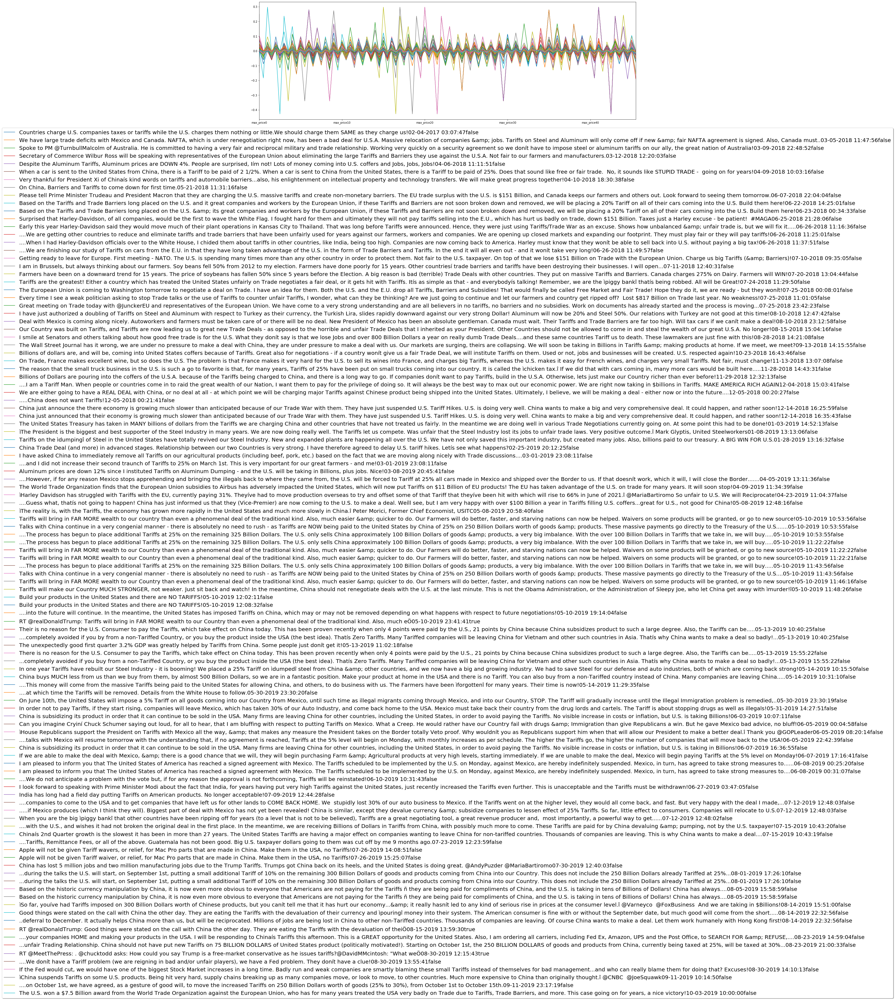

In [226]:
df_pch.T.plot(legend=True, figsize=(25, 8))
plt.legend(loc=(1,0))
plt.legend(loc='upper center', bbox_to_anchor = (0.5,-0.05),
fancybox=True, shadow=True, fontsize=20)
plt.vlines(x='price_0', ymin=-0.15, ymax=0.25)
plt.show()

In [248]:
df_china = df_full[df_full.text.str.contains(r'chin', flags=re.IGNORECASE, regex=True)]

In [247]:
df_china.to_csv('china_v2.csv')

In [245]:
df_full[df_full.text.str.contains(r'china',flags=re.IGNORECASE, regex=True)]\
['pct_sig_ch_high_low'].value_counts()

/Users/harryfield/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  


In [250]:
df_china.shape

(380, 174)

In [229]:
df_china = df_china[price_list]

In [230]:
df_china.index = df_china.text
df_china.drop(columns='text', inplace=True)

In [231]:
df_china.to_csv('china.csv')

In [232]:
df_china_eda = df_china.describe().T

In [233]:
df_china_eda['mean_abs'] = df_china_eda['mean'].abs()

In [234]:
df_china_eda.sort_values('mean_abs', ascending=False).head(10)

,count,mean,std,min,25%,50%,75%,max,mean_abs
min_price8,257.0,-0.021299,0.043187,-0.339426,-0.019335,-0.008859,0.000000,0.000000,0.021299
max_price41,257.0,0.020379,0.040042,0.000000,0.000000,0.008862,0.018816,0.297047,0.020379
min_price40,257.0,-0.019508,0.037262,-0.427201,-0.018435,-0.009157,0.000000,0.000000,0.019508
max_price34,257.0,0.019389,0.034445,0.000000,0.000000,0.008747,0.018868,0.279354,0.019389
min_price24,257.0,-0.019207,0.038255,-0.270365,-0.017723,-0.008859,0.000000,0.000000,0.019207
min_price14,257.0,-0.019193,0.029694,-0.225658,-0.018898,-0.009158,0.000000,0.000000,0.019193
min_price42,257.0,-0.019002,0.048299,-0.427201,-0.018313,-0.008828,0.000000,0.000000,0.019002
max_price20,257.0,0.018922,0.039263,0.000000,0.000000,0.009134,0.018930,0.297047,0.018922
min_price21,257.0,-0.018905,0.051183,-0.427201,-0.017364,-0.008717,0.000000,0.000000,0.018905
max_price35,257.0,0.018686,0.037731,0.000000,0.000000,0.009158,0.019022,0.279135,0.018686


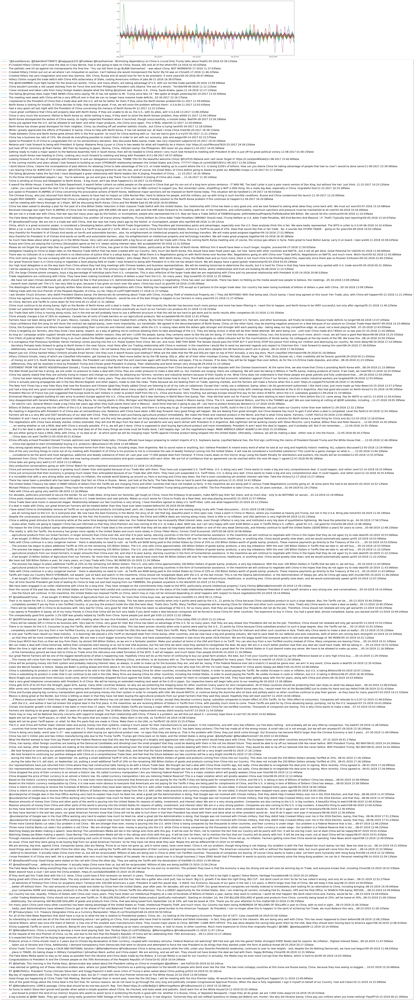

In [236]:
df_china.T.plot(legend=True, figsize=(25, 8))
plt.legend(loc=(1,0))
plt.legend(loc='upper center', bbox_to_anchor = (0.5,-0.05),
fancybox=True, shadow=True, fontsize=20)
plt.vlines(x='price_0', ymin=-0.15, ymax=0.25)
plt.show()

In [364]:
# Most of the variation seems to be in the first five minutes of tweets which in theory, should be impactful
# Below I will see if they actually are (maybe use China instead)
# Look also into most variation by minute with a .describe() maybe plot that as a bar for avg. movement
# Basically to answer the timeframe question - maybe read JP Morgan to see why they did it

In [365]:
df_full.shape

(8185, 179)

In [256]:
# LOOKING AT OVERALL MOVES

# Further EDA using various tie metrics to potentially add to dummy variables of hour

---

In [282]:
df_test_hour = df_full.groupby(by=\
                    [df_full.index.year, df_full.index.hour]).describe()

In [392]:
# What is the below showing?

In [393]:
df_test_hour[['y']]

pct_sig_ch_high_low_upper                                             
                            count      mean       std  min  25%  50%  75%  max
2016 0                      141.0  0.000000  0.000000  0.0  0.0  0.0  0.0  0.0
     1                      201.0  0.000000  0.000000  0.0  0.0  0.0  0.0  0.0
     2                      198.0  0.000000  0.000000  0.0  0.0  0.0  0.0  0.0
     3                      143.0  0.000000  0.000000  0.0  0.0  0.0  0.0  0.0
     4                       78.0  0.000000  0.000000  0.0  0.0  0.0  0.0  0.0
...                           ...       ...       ...  ...  ...  ...  ...  ...
2019 19                      98.0 -0.010204  0.226807 -1.0  0.0  0.0  0.0  1.0
     20                      66.0 -0.015152  0.123091 -1.0  0.0  0.0  0.0  0.0
     21                       7.0  0.000000  0.000000  0.0  0.0  0.0  0.0  0.0
     22                      89.0  0.011236  0.106000  0.0  0.0  0.0  0.0  1.0
     23                     111.0  0.018018  0.133620  0.0  0.0  0.0  0.0  1.0

[95 rows x 8 columns]

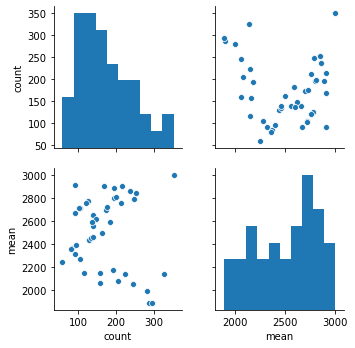

In [501]:
sns.pairplot(df_test_analysis['Open'][['count', 'mean']]);

In [337]:
df_test_analysis = df_full.groupby(by=\
                    [df_full.index.year, df_full.index.month]).describe()

In [338]:
df_test_analysis['y'].sort_values('std', ascending=False).head(10)

## Month in the year ##

count      mean       std  min  25%  50%  75%  max
level_0 level_0                                                    
2018    11         4.0  0.000000  1.154701 -1.0 -1.0  0.0  1.0  1.0
2019    1          4.0  0.000000  1.154701 -1.0 -1.0  0.0  1.0  1.0
2018    12        16.0  0.000000  1.032796 -1.0 -1.0  0.0  1.0  1.0
2019    5         28.0 -0.142857  1.007905 -1.0 -1.0 -1.0  1.0  1.0
2018    10        22.0 -0.181818  1.006473 -1.0 -1.0 -1.0  1.0  1.0
2019    10         9.0 -0.333333  1.000000 -1.0 -1.0 -1.0  1.0  1.0
        9          7.0 -0.428571  0.975900 -1.0 -1.0 -1.0  0.0  1.0
        8         27.0 -0.481481  0.893152 -1.0 -1.0 -1.0  0.0  1.0
2018    2         13.0 -0.538462  0.877058 -1.0 -1.0 -1.0 -1.0  1.0
        4          8.0 -0.750000  0.707107 -1.0 -1.0 -1.0 -1.0  1.0

In [342]:
df_day_analysis = df_full.groupby(by=\
                    [df_full.index.weekday]).describe()
df_day_analysis['y'].sort_values('std', ascending=False)

## Weekday ##

,count,mean,std,min,25%,50%,75%,max
level_0,,,,,,,,
1,24.0,-0.250000,0.989071,-1.0,-1.0,-1.0,1.0,1.0
3,38.0,-0.263158,0.977703,-1.0,-1.0,-1.0,1.0,1.0
0,23.0,-0.304348,0.973970,-1.0,-1.0,-1.0,1.0,1.0
4,47.0,-0.319149,0.957950,-1.0,-1.0,-1.0,1.0,1.0
2,19.0,-0.473684,0.904828,-1.0,-1.0,-1.0,0.0,1.0
6,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [341]:
df_test_analysis

## Supports the hypothesis that perhaps people have become imune to Trump's tweets ##

index                                                        \
                 count          mean         std      min       25%      50%   
level_0 level_0                                                                
2016    1        330.0  15683.866667  130.178439  15473.0  15560.25  15685.5   
        2        332.0  15210.849398  141.653917  14955.0  15087.75  15201.5   
        3        312.0  14736.868590  131.606004  14516.0  14617.75  14729.5   
        4        191.0  14364.078534   81.569403  14238.0  14286.50  14353.0   
        5        269.0  14061.092937   99.116445  13882.0  13990.00  14058.0   
        6        230.0  13731.456522   89.050623  13578.0  13660.25  13728.5   
        7        264.0  13390.954545  103.840501  13229.0  13294.75  13392.5   
        8        263.0  13042.870722   99.402098  12869.0  12951.50  13053.0   
        9        223.0  12712.497758   83.462776  12579.0  12638.50  12706.0   
        10       365.0  12301.769863  151.227747  12050.0  12187.00  12280.0   
        11       137.0  11957.197080   60.480896  11857.0  11905.00  11957.0   
        12        69.0  11798.927536   31.287716  11751.0  11776.00  11794.0   
2017    1        108.0  11574.379630   41.167249  11503.0  11541.75  11574.5   
        2        104.0  11425.942308   44.415476  11350.0  11389.75  11416.5   
        3        103.0  11275.436893   45.691993  11205.0  11230.50  11284.0   
        4        102.0  11123.911765   40.278511  11061.0  11086.25  11125.5   
        5        120.0  10980.550000   46.031748  10896.0  10946.75  10985.5   
        6        173.0  10785.728324   61.669234  10686.0  10730.00  10781.0   
        7        155.0  10557.064516   66.178004  10441.0  10495.50  10554.0   
        8        206.0  10310.344660   76.368507  10174.0  10245.25  10309.5   
        9        206.0  10022.864078   82.482761   9893.0   9944.25  10019.5   
        10       175.0   9715.988571   89.379855   9576.0   9635.00   9698.0   
        11       211.0   9442.672986   79.299085   9314.0   9366.50   9441.0   
        12       116.0   9219.853448   48.905633   9133.0   9183.75   9219.5   
2018    1        147.0   9018.768707   58.941237   8913.0   8973.50   9027.0   
        2        113.0   8823.433628   52.745324   8738.0   8782.00   8813.0   
        3        123.0   8654.089431   51.122323   8571.0   8610.50   8651.0   
        4        188.0   8442.765957   72.643798   8310.0   8393.75   8440.5   
        5        221.0   8183.389140   77.459213   8051.0   8121.00   8190.0   
        6        255.0   7852.478431  109.143509   7679.0   7742.50   7839.0   
        7        250.0   7492.112000   99.288045   7327.0   7410.25   7487.5   
        8        292.0   7133.756849  113.823064   6944.0   7037.75   7140.5   
        9        248.0   6751.899194  109.625540   6574.0   6645.75   6769.5   
        10       305.0   6374.275410  115.437225   6177.0   6276.00   6374.0   
        11       238.0   5985.886555   94.899190   5837.0   5896.25   5985.5   
        12       180.0   5714.838889   77.418991   5546.0   5661.75   5723.5   
2019    1        185.0   5379.675676   87.825436   5212.0   5285.00   5381.0   
        2        149.0   5047.201342   75.881396   4927.0   4993.00   5037.0   
        3        242.0   4724.181818  119.819886   4534.0   4611.25   4733.5   
        4        314.0   4311.232484  130.040323   4096.0   4193.25   4316.5   
        5        425.0   3733.755294  217.164340   3404.0   3549.00   3692.0   
        6        250.0   3127.556000  144.533451   2930.0   2994.25   3079.5   
        7        471.0   2562.900212  208.467000   2221.0   2381.50   2549.0   
        8        450.0   1912.766667  178.883785   1595.0   1776.25   1940.5   
        9        393.0   1082.422392  172.250455    736.0    940.00   1089.0   
        10       459.0    433.542484  183.601702    131.0    257.50    421.0   

                                   Unnamed: 0                ...  \
                      75%   

## Average Daily Volume
---

In [345]:
df_full = df_full.copy()

In [347]:
mean_daily_volumes = snp['VOL'].groupby(by=[snp.index.date]).mean()
mean_daily_volumes

2016-01-03     184.118644
2016-01-04    1617.917216
2016-01-05    1231.704545
2016-01-06    1622.542125
2016-01-07    2170.193407
                 ...     
2019-08-07    1894.534066
2019-08-08    1295.503297
2019-08-09    1467.986983
2019-08-11     145.762712
2019-08-12     311.424077
Name: VOL, Length: 1090, dtype: float64

In [348]:
df_full['date'] = df_full.index.date

In [349]:
df_full = pd.merge(df_full, mean_daily_volumes, left_on=df_full['date'], right_on=mean_daily_volumes.index, how='left')

In [350]:
df_full.head(1)

,key_0,level_0,index,Unnamed: 0,source,text,is_retweet,released_at,text_new,Close,...,volume_8,volume_9,pct_sig_ch_high_low,pct_sig_ch_high_low_10,pct_sig_ch_high_low_upper,pct_sig_ch_high_low_10_2,pct_sig_ch_high_low_5_2,y,date,VOL_y
0,2016-01-04,2016-01-04 03:42:00,15898,15899,Twitter for Android,"""@RhettRiley1234: Trump only wins with our vot...",False,01/04/2016 11:42:55,"""@RhettRiley1234: Trump only wins with our vot...",2009.25,...,155.0,155.0,0,0,0,0,0,NaN,2016-01-04,1617.917216


In [352]:
df_full.index = df_full.index

In [353]:
df_full.drop(columns=['key_0'], inplace=True)

In [354]:
df_full.head()

,level_0,index,Unnamed: 0,source,text,is_retweet,released_at,text_new,Close,High,...,volume_8,volume_9,pct_sig_ch_high_low,pct_sig_ch_high_low_10,pct_sig_ch_high_low_upper,pct_sig_ch_high_low_10_2,pct_sig_ch_high_low_5_2,y,date,VOL_y
0,2016-01-04 03:42:00,15898,15899,Twitter for Android,"""@RhettRiley1234: Trump only wins with our vot...",False,01/04/2016 11:42:55,"""@RhettRiley1234: Trump only wins with our vot...",2009.25,2009.75,...,155.000000,155.000000,0,0,0,0,0,NaN,2016-01-04,1617.917216
1,2016-01-04 09:31:00,15897,15898,Twitter Web Client,"I look forward to being in Lowell, Massachuset...",False,01/04/2016 17:31:48,"I look forward to being in Lowell, Massachuset...",1991.75,1991.75,...,-5.956113,-5.956113,0,0,0,0,0,NaN,2016-01-04,1617.917216
2,2016-01-04 12:00:00,15896,15897,Twitter Web Client,"Woody Johnson, owner of the NYJets, is @JebBus...",False,01/04/2016 20:00:04,"Woody Johnson, owner of the NYJets, is @JebBus...",1980.00,1981.75,...,32.936871,32.936871,0,0,0,0,0,NaN,2016-01-04,1617.917216
3,2016-01-04 18:20:00,15895,15896,Twitter for Android,"The rally in Lowell, Massachusetts, was amazin...",False,01/05/2016 02:20:58,"The rally in Lowell, Massachusetts, was amazin...",1976.25,1978.00,...,-10.487942,-10.487942,0,0,0,0,0,NaN,2016-01-04,1617.917216
4,2016-01-04 18:22:00,15894,15895,Twitter for Android,"""@troyconway: Now 2-more IT Firms going over s...",False,01/05/2016 02:22:57,"""@troyconway: Now 2-more IT Firms going over s...",1975.75,1977.25,...,53.225323,53.225323,0,0,0,0,0,NaN,2016-01-04,1617.917216


## Creating Mean hourly Volumes for that specific hour
---

In [355]:
hourly_mean_volumes = snp['volume_0'].groupby(by=[snp.index.date,snp.index.hour]).mean()

In [363]:
df_full.index = df_full.level_0

In [364]:
df_full['date_hour'] = list(zip(df_full.index.date, df_full.index.hour))

In [365]:
df_test_2 = pd.merge(df_full, hourly_mean_volumes, left_on=df_full['date_hour'], right_on=hourly_mean_volumes.index, how='left')

In [366]:
df_test_2.index = df_full.index

In [367]:
df_test_2.columns

Index(['key_0', 'level_0', 'index', 'Unnamed: 0', 'source', 'text',
       'is_retweet', 'released_at', 'text_new', 'Close',
       ...
       'pct_sig_ch_high_low', 'pct_sig_ch_high_low_10',
       'pct_sig_ch_high_low_upper', 'pct_sig_ch_high_low_10_2',
       'pct_sig_ch_high_low_5_2', 'y', 'date', 'VOL_y', 'date_hour',
       'volume_0_y'],
      dtype='object', length=185)

In [368]:
df_test_2.drop(columns=['key_0', 'date_hour'], inplace=True)

## Creating mean hourly volumes across entire dataset
---

In [369]:
hourly_mean_volumes_total = df_test_2['volume_0_y'].groupby(by=[df_full.index.hour]).mean()

In [370]:
df_test_2['hour'] = df_test_2.index.hour

In [371]:
df_test_2 = pd.merge(df_test_2, hourly_mean_volumes_total, left_on=df_test_2['hour'], right_on=hourly_mean_volumes_total.index, how='left')

In [372]:
df_test_2.drop(columns=['key_0', 'hour'], inplace=True)

In [373]:
df_test_2.columns

Index(['level_0', 'index', 'Unnamed: 0', 'source', 'text', 'is_retweet',
       'released_at', 'text_new', 'Close', 'High',
       ...
       'pct_sig_ch_high_low', 'pct_sig_ch_high_low_10',
       'pct_sig_ch_high_low_upper', 'pct_sig_ch_high_low_10_2',
       'pct_sig_ch_high_low_5_2', 'y', 'date', 'VOL_y', 'volume_0_y_x',
       'volume_0_y_y'],
      dtype='object', length=184)

In [374]:
df_test_2.index= df_full.index

In [ ]:
#VOL_y = average daily volume
#volume_0_y_x = mean hourly volumes for specific hour
#volume_0_y_y = mean hourly volumes across entire dataset

In [ ]:
# Renaming Columns for ease of identification

## Sustained Volume Increase?
---

In [556]:
df_full_hour_analysis

,volume_-5,volume_-4,volume_-3,volume_-2,volume_-1,Volume,volume_1,volume_2,volume_3,volume_4,...,volume_11,volume_12,volume_13,volume_14,volume_15,volume_16,volume_17,volume_18,volume_19,volume_20
0,168.153005,169.439891,172.065574,160.775956,162.584699,164.021858,179.464481,170.467213,153.161202,146.459016,...,191.207650,190.677596,197.150273,180.500000,177.215847,163.428962,177.139344,190.680328,171.978142,170.866120
1,181.837772,181.167070,185.907990,181.380145,181.181598,167.891041,182.343826,193.615012,190.692494,189.411622,...,202.595642,177.077482,182.014528,180.789346,173.225182,175.370460,158.786925,164.641646,175.104116,163.111380
2,143.603774,128.601415,130.132075,121.820755,114.948113,114.818396,120.014151,115.792453,124.066038,116.391509,...,143.643868,122.834906,137.139151,121.443396,130.240566,120.028302,126.893868,115.872642,126.459906,126.745283
3,170.717608,144.348837,147.438538,175.767442,149.863787,149.242525,140.235880,148.996678,151.737542,145.900332,...,129.083056,119.611296,129.697674,125.176080,119.990033,125.179402,130.046512,119.029900,105.784053,98.099668
4,89.751773,93.397163,86.943262,75.248227,91.815603,99.290780,93.170213,88.503546,86.546099,99.858156,...,84.992908,102.425532,98.680851,87.205674,77.148936,91.609929,89.801418,91.709220,85.787234,90.375887
5,150.194030,129.089552,125.552239,135.686567,122.940299,107.880597,118.149254,123.507463,126.940299,118.716418,...,153.835821,113.328358,126.656716,145.253731,114.985075,144.582090,200.402985,224.865672,180.447761,167.552239
6,117.181818,136.666667,144.151515,130.060606,142.090909,154.909091,163.090909,143.878788,137.757576,135.000000,...,139.575758,236.606061,181.090909,140.151515,171.666667,149.424242,175.363636,168.727273,188.333333,149.090909
7,277.782609,335.347826,342.347826,354.260870,340.826087,446.739130,504.652174,497.260870,339.608696,467.695652,...,420.347826,409.652174,415.000000,375.043478,394.913043,479.391304,414.913043,439.217391,392.478261,447.434783
8,319.625000,395.250000,388.937500,324.875000,322.562500,593.750000,340.375000,450.812500,376.562500,374.000000,...,241.062500,299.312500,263.062500,325.250000,359.937500,369.687500,246.687500,335.562500,439.937500,413.750000
9,310.611111,306.722222,312.703704,286.870370,378.166667,303.351852,300.648148,290.222222,311.648148,301.592593,...,352.870370,592.481481,314.296296,320.240741,222.037037,346.944444,395.981481,392.203704,296.888889,295.962963


In [411]:
df_test_2.iloc[:,153:174].columns

Index(['volume_0_x', 'volume_1', 'volume_10', 'volume_11', 'volume_12',
       'volume_13', 'volume_14', 'volume_15', 'volume_16', 'volume_17',
       'volume_18', 'volume_19', 'volume_2', 'volume_20', 'volume_3',
       'volume_4', 'volume_5', 'volume_6', 'volume_7', 'volume_8', 'volume_9'],
      dtype='object')

In [412]:
df_test_2['vol_20_avg'] = df_test_2.iloc[:,153:174].mean(axis=1)

In [413]:
df_test_2['sustained_vol'] = df_test_2['vol_20_avg']/df_test_2['volume_0_y_y']

{'whiskers': [<matplotlib.lines.Line2D at 0x11e429cc0>,
 'caps': [<matplotlib.lines.Line2D at 0x11e4295c0>,
 'boxes': [<matplotlib.lines.Line2D at 0x11f5a0e10>],
 'medians': [<matplotlib.lines.Line2D at 0x1160d4668>],
 'fliers': [<matplotlib.lines.Line2D at 0x11f5b9048>],
 'means': []}

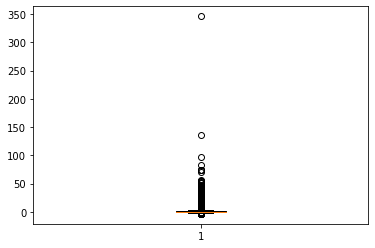

In [414]:
plt.boxplot(df_test_2['sustained_vol']) # Distribution of sustained volume points, some interesting outliers

In [ ]:
# Need to add sentiment scores etc.

In [126]:
df_test_2[['pct_sig_ch_open_close', 'pct_sig_ch_high_low','sustained_vol']].corr()

,pct_sig_ch_open_close,pct_sig_ch_high_low,sustained_vol
pct_sig_ch_open_close,1.000000,0.625733,0.000324
pct_sig_ch_high_low,0.625733,1.000000,0.006617
sustained_vol,0.000324,0.006617,1.000000


# Create hour binary variable

---

In [426]:
df_final = df_test_2[['text_new', 'y', 'sustained_vol', 'VOL_y', 'volume_0_y_x','volume_0_y_y']]

In [427]:
df_final.y.fillna(0, inplace=True)

In [428]:
df_final.head()

,text_new,y,sustained_vol,VOL_y,volume_0_y_x,volume_0_y_y
level_0,,,,,,
2016-01-04 03:42:00,"""@RhettRiley1234: Trump only wins with our vot...",0.0,0.603253,1617.917216,44.039403,256.940111
2016-01-04 09:31:00,"I look forward to being in Lowell, Massachuset...",0.0,-0.042494,1617.917216,14.931938,140.164699
2016-01-04 12:00:00,"Woody Johnson, owner of the NYJets, is @JebBus...",0.0,0.387911,1617.917216,24.466995,84.908412
2016-01-04 18:20:00,"The rally in Lowell, Massachusetts, was amazin...",0.0,-0.226015,1617.917216,14.439084,46.403724
2016-01-04 18:22:00,"""@troyconway: Now 2-more IT Firms going over s...",0.0,1.147005,1617.917216,14.439084,46.403724


In [429]:
df_final['hour'] = df_full.index.hour

/Users/harryfield/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [430]:
df_final = pd.get_dummies(df_final, columns=['hour'], drop_first=True)

In [431]:
df_final.head()

,text_new,y,sustained_vol,VOL_y,volume_0_y_x,volume_0_y_y,hour_1,hour_2,hour_3,hour_4,...,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_23
level_0,,,,,,,,,,,,,,,,,,,,,
2016-01-04 03:42:00,"""@RhettRiley1234: Trump only wins with our vot...",0.0,0.603253,1617.917216,44.039403,256.940111,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2016-01-04 09:31:00,"I look forward to being in Lowell, Massachuset...",0.0,-0.042494,1617.917216,14.931938,140.164699,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2016-01-04 12:00:00,"Woody Johnson, owner of the NYJets, is @JebBus...",0.0,0.387911,1617.917216,24.466995,84.908412,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2016-01-04 18:20:00,"The rally in Lowell, Massachusetts, was amazin...",0.0,-0.226015,1617.917216,14.439084,46.403724,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2016-01-04 18:22:00,"""@troyconway: Now 2-more IT Firms going over s...",0.0,1.147005,1617.917216,14.439084,46.403724,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


In [432]:
def correlation_heat_map(df):
    corrs = df.corr()
    corrs = df.corr()[(df.corr() < 1.0) & (df.corr() > 0.1) | (df.corr() < -0.1)].dropna(how='all')
    fig, ax = plt.subplots(figsize=(20, 9))
    ax = sns.heatmap(corrs, annot=True, cmap='coolwarm')
    

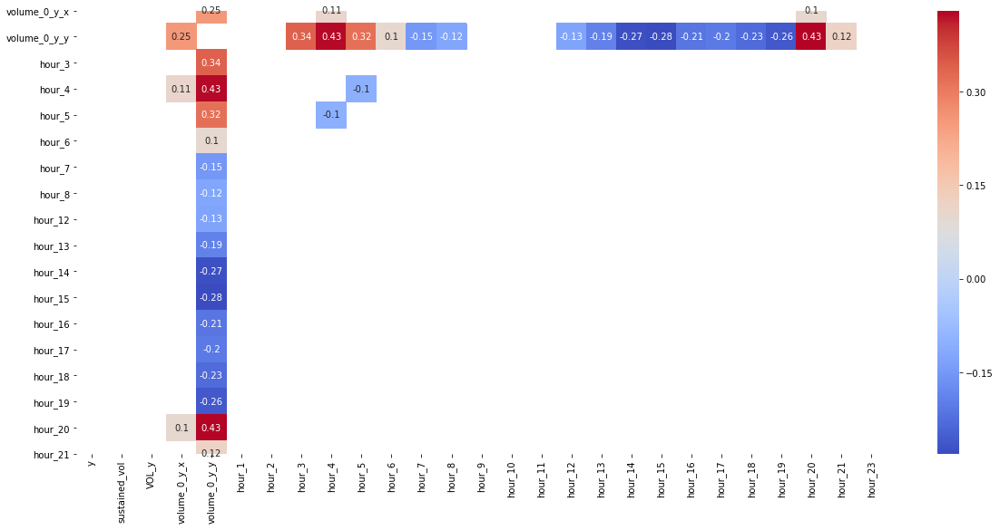

In [433]:
correlation_heat_map(df_final)

In [414]:
df_final['weekday'] = df_final.index.weekday

In [415]:
df_final = pd.get_dummies(df_final, columns=['weekday'], drop_first=True)

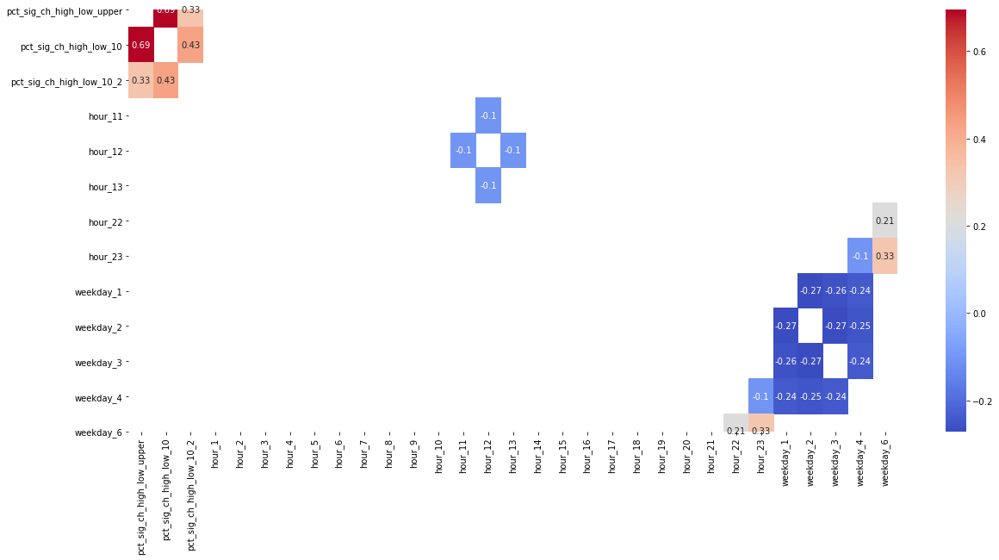

In [416]:
correlation_heat_map(df_final)

In [ ]:
# still need to add sustained volume and vader compound #

In [380]:
df_test_2.to_csv('sp500_trump_update')

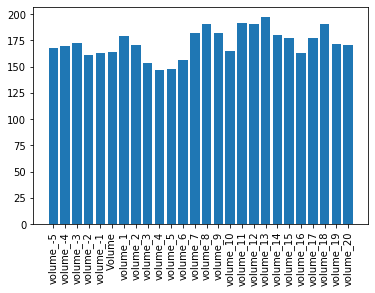

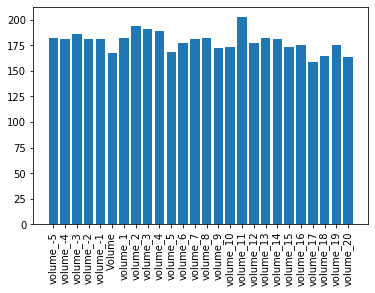

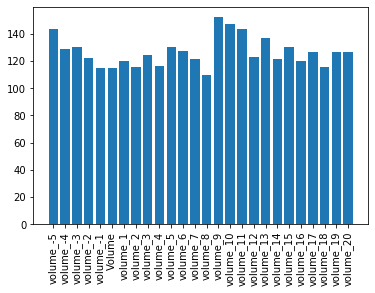

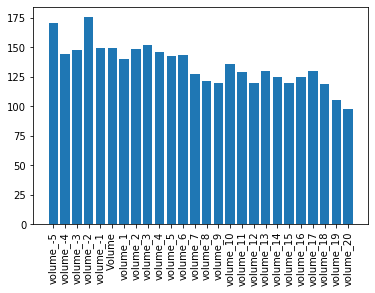

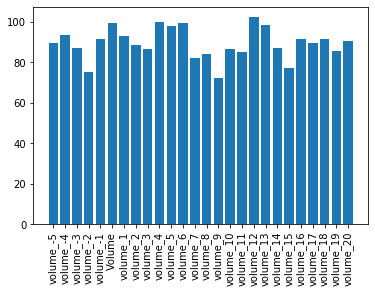

...

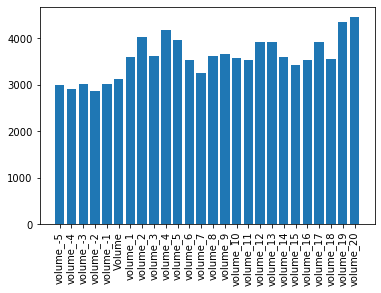

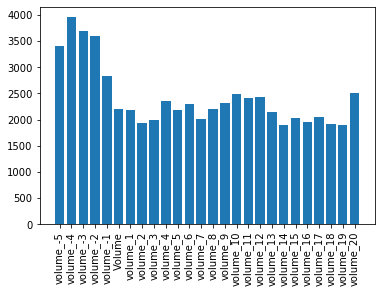

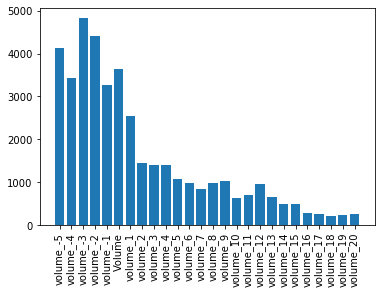

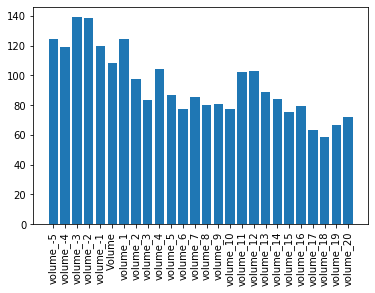

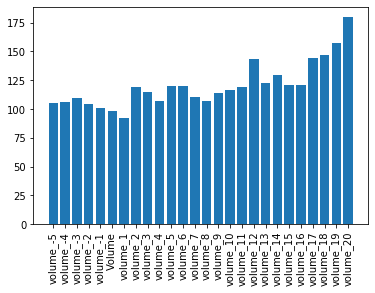

In [388]:
for i in range(0,24):
    plt.bar(df_full_hour_analysis.columns, df_full_hour_analysis.iloc[i])
    plt.xticks(rotation=90)
    plt.show()

In [592]:
# Unusual patterns have emerged here:
    # Hours 22/23 have seemingly worked against eachother, one showing a strong decline, the other a big rise
    # Equally Hour 21 shows substaintial Volume up until the stroke of 9 (potentially mkt closing)
    # Other than that, there is a general lack of consistecy in the pattern, it would be interesting to see
    # These charts link back to the explanatory variable

In [ ]:
# Correlate hour of the day with each of the potential y-variables